<a href="https://colab.research.google.com/github/tperellom/Projectes/blob/develop/HeatDiffusion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Packages and utils

In [ ]:
!pip install fipy

     |████████████████████████████████| 6.0MB 11.6MB/s 
  Created wheel for fipy: filename=FiPy-3.4.2.1-cp37-none-any.whl size=428098 sha256=1cc5548355ed882980fce6227840b3284dda12ed927440c3b8a101b096cb15e0
  Stored in directory: /root/.cache/pip/wheels/c0/7d/13/fb271572a3281d70dd3afeed715d37aef2298cdc54c449455c
Successfully built fipy


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import os
import io
from PIL import Image
import imageio
from IPython.display import Image as IPyImage

import fipy
from fipy import *
from fipy.viewers.matplotlibViewer.matplotlibStreamViewer import MatplotlibStreamViewer

In [ ]:
GIF_PATH = './animation.gif'

In [ ]:
def plot_space_at_timestep(C, t, color='jet', width=20, height=3, vmin='auto', vmax='auto', inverse=False, name = None):
  Cval = C[t]
  XC, YC = mesh.vertexCoords
  Xcoor = XC[:nx+1]   #(np.arange(nx+1)*round(dx,1))
  Ycoor = YC[::nx+1]  #(np.arange(ny+1)*round(dx,1))
  plt.figure(figsize=(width, height))

  if vmax == 'auto':
    vmax = np.max(Cval)
    #vmax=max([np.max(i) for i in C]
  if vmin == 'auto':
    vmin = np.min(Cval)
    #vmin=min([np.min(i) for i in C])

  plt.pcolormesh(Xcoor, Ycoor, Cval, cmap=color, vmin=vmin, vmax=vmax)
  plt.colorbar(orientation='vertical')
  plt.xlim(0,Lx)
  plt.ylim(0,Ly)
  if inverse:
    plt.gca().invert_yaxis()
    plt.gca().invert_xaxis()
  plt.ylabel('Y-dim (m)')
  plt.xlabel('X-dim (m)')

  if t < 0:
    t = len(C) + t

  if name is not None:
    plt.title('{} at time-step {}'.format(name, t))
  else:
    plt.title('Time-step {}'.format(t))

In [ ]:
def plot_evolution(C):
  
  y = [np.mean(i) for i in C]
  x = np.arange(len(C))
  plt.plot(x, y, '--')
  
  plt.ylabel('Variable')
  plt.xlabel('Timestep')
  plt.title('Evolution')

In [ ]:
def make_gif_from_meshplots(Clist, fps=10, vmin = 'auto', jump=1, vmax = 'auto', color='jet', width=20, height=3, name=None):
  
  images = []
  plt.clf()

  for t in range(len(Clist))[::jump]:
    # Make plots
    plot_space_at_timestep(Clist, t, color=color, width = width, height = height, vmin=vmin, vmax=vmax, inverse=False, name = name)
    plt.tight_layout()
    
    # Save the figure
    buffer = io.BytesIO()
    plt.savefig(buffer, format='png')
    buffer.seek(0)
    image = Image.open(buffer)
    images.append(np.array(image))

    plt.close()

  #Build GIF
  imageio.mimsave(GIF_PATH, images, fps=fps)

# Heat diffusion

## PDE system

<h4><center>Partial Differential Equation:</center></h4>
$$
\frac{\partial T}{\partial t} = \alpha \Big[\frac{\partial^2 T}{\partial x^2} + \frac{\partial^2 T}{\partial y^2} \Big]
$$ 

## Mesh

In [ ]:
# Geometry
Lx = 10   # meters
Ly = 10    # meters
nx = 100  # nodes
ny = 100

# Build the mesh:
mesh = Grid2D(Lx=Lx, Ly = Ly, nx=nx, ny=ny)
X,Y = mesh.cellCenters
xx, yy = mesh.faceCenters

##Variables and initial & boundary conditions

In [ ]:
# Main variable and initial conditions
T = CellVariable(name="heat", 
                 mesh=mesh,
                 value=300.)

In [ ]:
alpha = 4. # Diffusion coefficient Dx = Dy

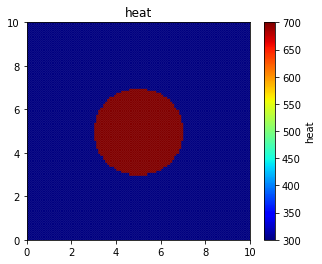

In [ ]:
# Initial conditions
T.setValue(700., where=((X-5)**2 + (Y-5)**2 <= 2**2))
#viewer = fipy.Matplotlib2DViewer(T, datamin=300., datamax=700.)

In [ ]:
# Boundary conditions
T.constrain(300., where=mesh.facesTop) 
T.constrain(300., where=mesh.facesBottom)
T.constrain(300., where=mesh.facesRight)
T.constrain(300., where=mesh.facesLeft)

In [ ]:
# Equation definition
eqT = (TransientTerm(var = T) == DiffusionTerm(coeff=alpha, var = T))

##Solution

In [ ]:
# PDESolver hyperparameters
dx = mesh.dx
dy = mesh.dy

dt = 0.9 * dx**2 * dy**2 / (2 * alpha * (dx**2 + dy**2))   # maximum time step
steps = 200  #
print('Total time: {} seconds'.format(dt*steps))

Total time: 0.11250000000000003 seconds


In [ ]:
# Solve

# Store each timestep in a list for plotting purposes:
Tevol = [np.array(T.value.reshape((ny, nx)))]

for step in range(steps):
  eqT.solve(dt=dt)

  # Keep track of the solutions:
  sol = np.array(T.value.reshape((ny, nx)))
  Tevol.append(sol)

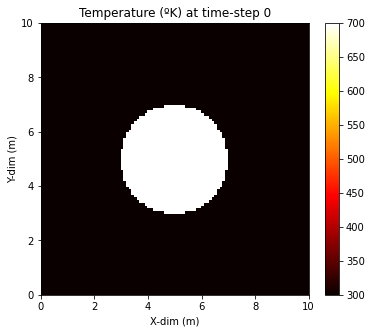

In [ ]:
# Plot initial conditions (t=0):
plot_space_at_timestep(Tevol, 0, color='hot', width=6, height=5, vmin=300, vmax=700, name = 'Temperature (ºK)')

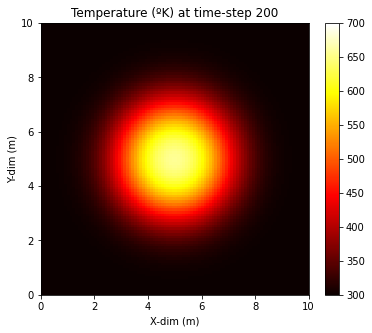

In [ ]:
# Plot final state (t=200)
plot_space_at_timestep(Tevol, -1, color='hot', width=6, height=5, vmin=300, vmax=700, name = 'Temperature (ºK)')

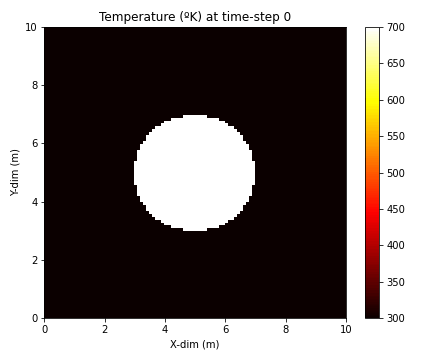

<Figure size 432x288 with 0 Axes>

In [ ]:
# Create a gif to show the evolution of the states:

# It may some time (depends on the "time-resolution")
make_gif_from_meshplots(Tevol, fps=15, color='hot', vmin=300, vmax=700, width=6, height=5, name = 'Temperature (ºK)')
IPyImage(GIF_PATH, format='png')

Text(0, 0.5, 'Temperature (ºK)')

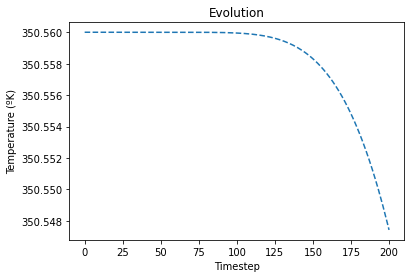

In [ ]:
#Plot the mean temperature in the mesh
#(In this case, as there is no source, it will be practically constant):

plot_evolution(Tevol)
plt.ticklabel_format(useOffset=False)
plt.ylabel('Temperature (ºK)')